In [144]:
import nltk
from nltk.stem import WordNetLemmatizer 
from nltk.tokenize import word_tokenize 
from nltk.corpus import stopwords
import re
import inflect
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.pylab as plb
from wordcloud import WordCloud, STOPWORDS
 
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Rahul\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Rahul\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Rahul\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Rahul\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [145]:
p = inflect.engine()
lemmatizer = WordNetLemmatizer()

In [146]:
def read_book(path):
    file = open(path,'r',encoding='utf-8')
    read = file.readlines()
    res = "".join(line for line in read)
    return res

In [147]:
def print_book_title_and_length(book):
  print(book[:40],len(book))

In [148]:
def discard_useless_part_1 (text):
  start_idx = text.find('Introduction')
  end_idx = text.find('From the Chronotype ')
  print("Discarding Before - ", start_idx)
  print("Discarding After - ", end_idx)
  text = text[start_idx:end_idx]
  return text

In [149]:
def discard_useless_part_2 (text):
  start_idx = text.find('TO WELLS BROWN,OF OHIO.')
  end_idx = text.find('CHAPTER XIV. ')
  print("Discarding Before - ", start_idx)
  print("Discarding After - ", end_idx)
  text = text[start_idx:end_idx]
  return text

In [150]:
def discard_useless_part_3 (text):
  start_idx = text.find('CHAPTER I.')
  end_idx = text.find('March 4 ')
  print("Discarding Before - ", start_idx)
  print("Discarding After - ", end_idx)
  text = text[start_idx:end_idx]
  return text

In [151]:
def to_lower(text):
  return text.lower()

In [152]:
def remove_URL(text):
    return re.sub(r"http\S+", "", text)

In [153]:
def decontracted(text):
    # specific
    text = re.sub(r"won\'t", "will not", text)
    text = re.sub(r"can\'t", "can not", text)

    # general
    text = re.sub(r"n\'t", " not", text)
    text = re.sub(r"\'re", " are", text)
    text = re.sub(r"\'s", " is", text)
    text = re.sub(r"\'d", " would", text)
    text = re.sub(r"\'ll", " will", text)
    text = re.sub(r"\'t", " not", text)
    text = re.sub(r"\'ve", " have", text)
    text = re.sub(r"\'m", " am", text)
    return text

In [154]:
def num2word(text):
  list_of_words = text.split()
  modified_text = []

  for word in list_of_words:
    if word.isdigit():
      number_in_word = p.number_to_words(word)
      modified_text.append(number_in_word)
    else:
      modified_text.append(word)
      
  return ' '.join(modified_text)

In [155]:
def remove_punctuation(text):
  tokens = word_tokenize(text)
  words = [word for word in tokens if word.isalpha()]
  return ' '.join(words)

In [156]:
def lemmatize_word(text): 
    word_tokens = word_tokenize(text)  
    lemmas = [lemmatizer.lemmatize(word, pos ='v') for word in word_tokens] 
    return ' '.join(lemmas) 

In [157]:
def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off");

In [158]:
with open('NARRATIVE 1.txt', 'r') as f:
    book_path_1 = f.read()

In [159]:
book_path_1

'ï»¿NARRATIVE\nOF THE\nLIFE AND ADVENTURES\nOF\nHENRY BIBB,\nAN AMERICAN SLAVE,\nWRITTEN BY HIMSELF\nWITH\nAN INTRODUCTION\nBY LUCIUS C. MATLACK.\nNEW YORK:\nPUBLISHED BY THE AUTHOR; 5 SPRUCE STREET.\n1849.\n\nPage verso\nEntered according to the Act of Congress in the year 1849,\nBy HENRY BIBB,\nIn the Clerk\'s Office of the District Court of the Southern District\nof New York.\nMACDONALD & LEE, PRINTERS,\n9 SPRUCE STREET, N. Y.\n\nPage i\nINTRODUCTION.\nÂ\xa0Â\xa0Â\xa0Â\xa0Â\xa0Â\xa0Â\xa0Â\xa0FROM the most obnoxious substances we often see spring forth, beautiful and fragrant, flowers of every hue, to regale the eye, and perfume the air. Thus, frequently, are results originated which are wholly unlike the cause that gave them birth. An illustration of this truth is afforded by the history of American Slavery.\nÂ\xa0Â\xa0Â\xa0Â\xa0Â\xa0Â\xa0Â\xa0Â\xa0Naturally and necessarily, the enemy of literature, it has come the prolific theme of much that is profound in argument, sublime in poet

In [160]:
with open('NARRATIVE 2.txt', 'r') as f:
    book_path_2 = f.read()

In [161]:
with open('NARRATIVE 3.txt', 'r') as f:
    text = f.read()

In [162]:
book_path_1 = 'NARRATIVE 1.txt'
def PreProcessedBook(path):
  book = read_book(path)
  print_book_title_and_length(book)
  text = discard_useless_part_1(book)
  text = to_lower(text)
  text = remove_URL(text)
  text = decontracted(text)
  text = num2word(text)
  text = remove_punctuation(text)
  text = lemmatize_word(text)
  return (text)

In [163]:
book_path_2 = 'NARRATIVE 2.txt'
def PreProcessedBook(path):
  book = read_book(path)
  print_book_title_and_length(book)
  text = discard_useless_part_2(book)
  text = to_lower(text)
  text = remove_URL(text)
  text = decontracted(text)
  text = num2word(text)
  text = remove_punctuation(text)
  text = lemmatize_word(text)
  return (text)

In [164]:
book_path_3 = 'NARRATIVE 3.txt'
def PreProcessedBook(path):
  book = read_book(path)
  print_book_title_and_length(book)
  text = discard_useless_part_3(book)
  text = to_lower(text)
  text = remove_URL(text)
  text = decontracted(text)
  text = num2word(text)
  text = remove_punctuation(text)
  text = lemmatize_word(text)
  return (text)

In [165]:
book = read_book(book_path_1)
print(book[:2000])

﻿NARRATIVE
OF THE
LIFE AND ADVENTURES
OF
HENRY BIBB,
AN AMERICAN SLAVE,
WRITTEN BY HIMSELF
WITH
AN INTRODUCTION
BY LUCIUS C. MATLACK.
NEW YORK:
PUBLISHED BY THE AUTHOR; 5 SPRUCE STREET.
1849.

Page verso
Entered according to the Act of Congress in the year 1849,
By HENRY BIBB,
In the Clerk's Office of the District Court of the Southern District
of New York.
MACDONALD & LEE, PRINTERS,
9 SPRUCE STREET, N. Y.

Page i
INTRODUCTION.
        FROM the most obnoxious substances we often see spring forth, beautiful and fragrant, flowers of every hue, to regale the eye, and perfume the air. Thus, frequently, are results originated which are wholly unlike the cause that gave them birth. An illustration of this truth is afforded by the history of American Slavery.
        Naturally and necessarily, the enemy of literature, it has come the prolific theme of much that is profound in argument, sublime in poetry, and thrilling in narrative. From the soil of slavery itself have sprang forth some of the

In [166]:
book = read_book(book_path_2)
print(book[:2000])

﻿NARRATIVE
OF
WILLIAM W. BROWN,
A
FUGITIVE SLAVE. WRITTEN BY HIMSELF.

                         ----Is there not some chosen curse,
                         Some hidden thunder in the stores of heaven,
                         Red with uncommon wrath, to blast the man
                         Who gains his fortune from the blood of souls?
                                                  COWPER
BOSTON:
PUBLISHED AT THE ANTI-SLAVERY OFFICE,
NO. 25 CORNHILL.
1847.

Page verso
Entered according to Act of Congress, in the year 1847,
BY WILLIAM W. BROWN,
In the Clerk's Office of the District Court of Massachusetts.
Andrews & Prentiss, Printers.

Page iii
TO WELLS BROWN, OF OHIO.
        THIRTEEN years ago, I came to your door, a weary fugitive from chains and stripes. I was a stranger, and you took me in. I was hungry, and you fed me. Naked was I, and you clothed me. Even a name by which to be known among men, slavery had denied me. You bestowed upon me your own. Base indeed should I be, if

In [167]:
book = read_book(book_path_3)
print(book[:2000])

﻿BEHIND THE SCENES.
BY
ELIZABETH KECKLEY,
FORMERLY A SLAVE, BUT MORE RECENTLY MODISTE, AND FRIEND TO MRS.
ABRAHAM LINCOLN.
OR,
THIRTY YEARS A SLAVE, AND FOUR YEARS IN
THE WHITE HOUSE.
New York:
G. W. Carleton & Co., Publishers.
M DCCC LXVIII.

Page verso
Entered according to Act of Congress, in the year 1868, by
ELIZABETH KECKLEY,
In the Office of the Clerk of the District Court of the United States for
the Southern District of Pennsylvania.
THE NEW YORK PRINTING COMPANY,
81, 83, and 85 Centre Street,
New York.

Page ix
CONTENTS.
    • Preface . . . . . 11
    • CHAPTER I.
Where I was born . . . . . 17
    • CHAPTER II.
Girlhood and its Sorrows . . . . . 31
    • CHAPTER III.
How I gained my Freedom . . . . . 43
    • CHAPTER IV.
In the Family of Senator Jefferson Davis . . . . . 63
    • CHAPTER V.
My Introduction to Mrs. Lincoln . . . . . 76
    • CHAPTER VI.
Willie Lincoln's Death-bed . . . . . 91
    • CHAPTER VII.
Washington in 1862-3 . . . . . 111

Page x
    • CHAPTER VIII.
Cand

In [168]:
import nltk
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\Rahul\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [169]:
book_text_1 = PreProcessedBook(book_path_1)

﻿NARRATIVE
OF THE
LIFE AND ADVENTURES
OF 296840
Discarding Before -  29634
Discarding After -  -1


In [170]:
book_text_2 = PreProcessedBook(book_path_2)

﻿NARRATIVE
OF
WILLIAM W. BROWN,
A
FUGITI 113586
Discarding Before -  10511
Discarding After -  -1


In [171]:
book_text_3 = PreProcessedBook(book_path_3)

﻿BEHIND THE SCENES.
BY
ELIZABETH KECKLEY 329421
Discarding Before -  569
Discarding After -  -1


In [172]:
print(book_text_1[:2000])


chapter sketch of my early separation from my mother hard first experiment at run earnest long for abhorrent nature of slavery i be bear may of a slave mother in shelby county kentucky and be claim as the property of david white esq he come into possession of my mother long before i be bear i be bring up in the counties of shelby henry oldham and trimble or more correctly speak in the above counties i may safely say i be flog up for where i should have receive moral mental and religious instruction i receive strip without number the object of which be to degrade and keep me in subordination i can truly say that i drink deeply of the bitter cup of suffer and woe i have be drag page fourteen down to the lowest depths of human degradation and wretchedness by slaveholders my mother be know by the name of milldred jackson she be the mother of seven slave only all be sons of whom i be the eldest she be also so fortunate or unfortunate as to have some of what be call the slaveholding blood fl

In [173]:
print(book_text_2[:20000])


chapter i be bear in lexington the man who steal me as soon as i be bear record the birth of all the infants which he claim to be bear his property in a book which he keep for that purpose my mother be name be elizabeth she have seven children viz solomon leander benjamin joseph millford elizabeth and myself no two of us be children of the same father my father be name as i learn from my mother be george higgins he be a white man a relative of my master and connect with some of the first families in kentucky my master own about forty slave of whom be field hand he remove from page fourteen kentucky to missouri when i be quite young and settle thirty or forty miles above charles on the missouri where in addition to his practice as a physician he carry on mill merchandizing and farm he have a large farm the principal productions of which be tobacco and hemp the slave cabin be situate on the back part of the farm with the house of the overseer whose name be grove cook in their midst he ha

In [174]:
print(book_text_3[:2000])


chapter where i be bear seventeen chapter ii girlhood and its sorrow chapter iii how i gain my freedom chapter iv in the family of senator jefferson davis chapter my introduction to lincoln chapter vi willie lincoln be chapter vii washington in one hundred and eleven page x chapter viii candid opinions one hundred and chapter ix behind the scenes one hundred and chapter the second inauguration one hundred and chapter xi the assassination of president lincoln one hundred and chapter xii lincoln leave the white house two hundred and one chapter xiii the origin of the rivalry between douglas and lincoln two hundred and chapter xiv old friends two hundred and chapter xv the secret history of lincoln be wardrobe in new york two hundred and appendix letter from lincoln to keckley three hundred and page xi preface i have often be ask to write my life as those who know me know that it have be an eventful one at last i have accede to the importunities of my friends and have hastily sketch some 

<AxesSubplot:>

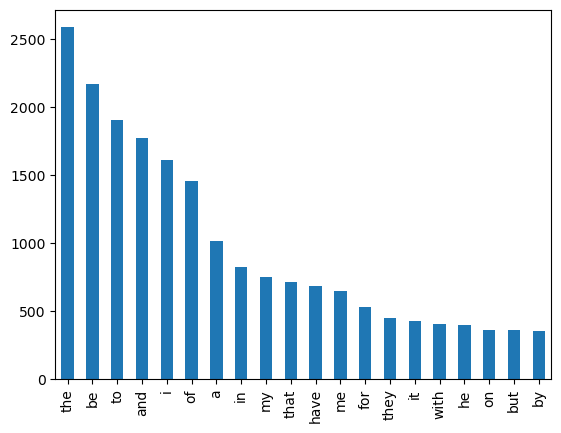

In [175]:
word_tokens_1 = word_tokenize(book_text_1) 
pd.Series(word_tokens_1).value_counts()[:20].plot(kind='bar')

<AxesSubplot:>

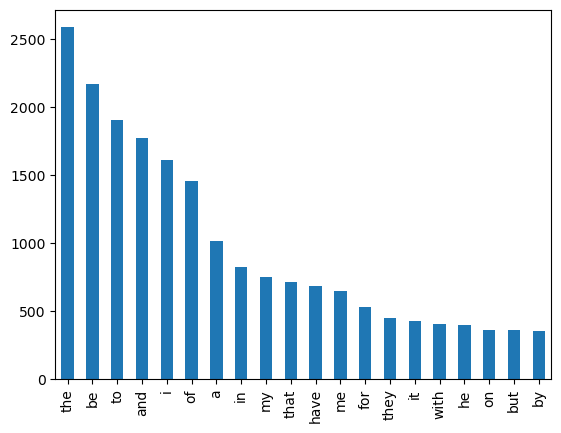

In [176]:
word_tokens_2 = word_tokenize(book_text_2) 
pd.Series(word_tokens_1).value_counts()[:20].plot(kind='bar')

<AxesSubplot:>

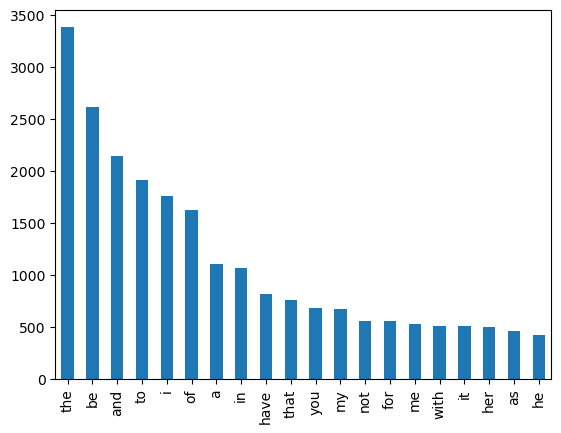

In [177]:
word_tokens_3 = word_tokenize(book_text_3) 
pd.Series(word_tokens_3).value_counts()[:20].plot(kind='bar')

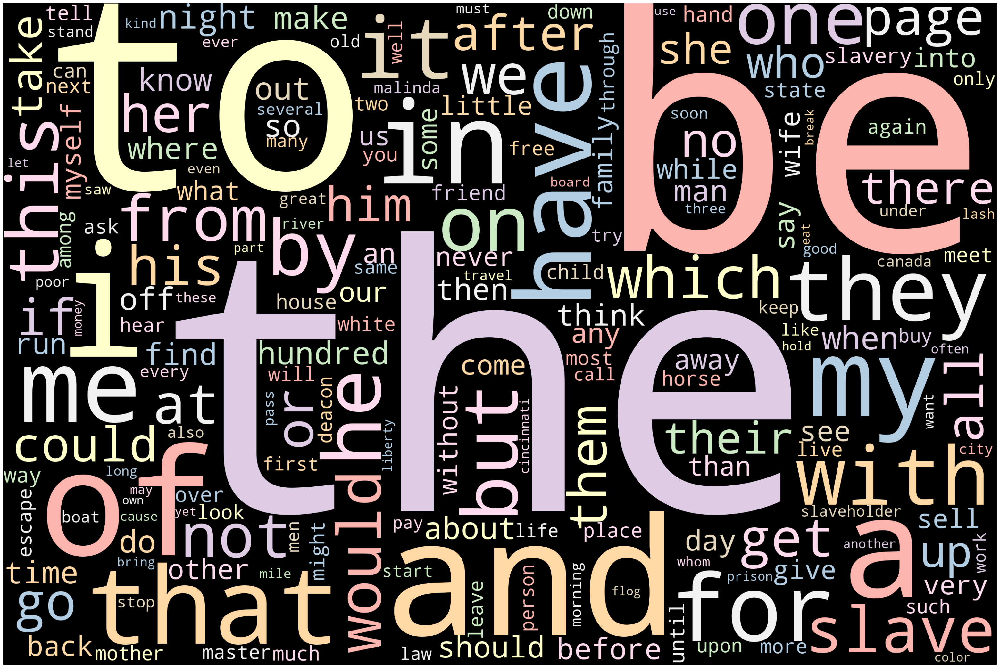

In [178]:
# Generate word cloud
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='black', colormap='Pastel1',stopwords= [], collocations=False).generate(' '.join(word_tokens_1))
# Plot
plot_cloud(wordcloud)

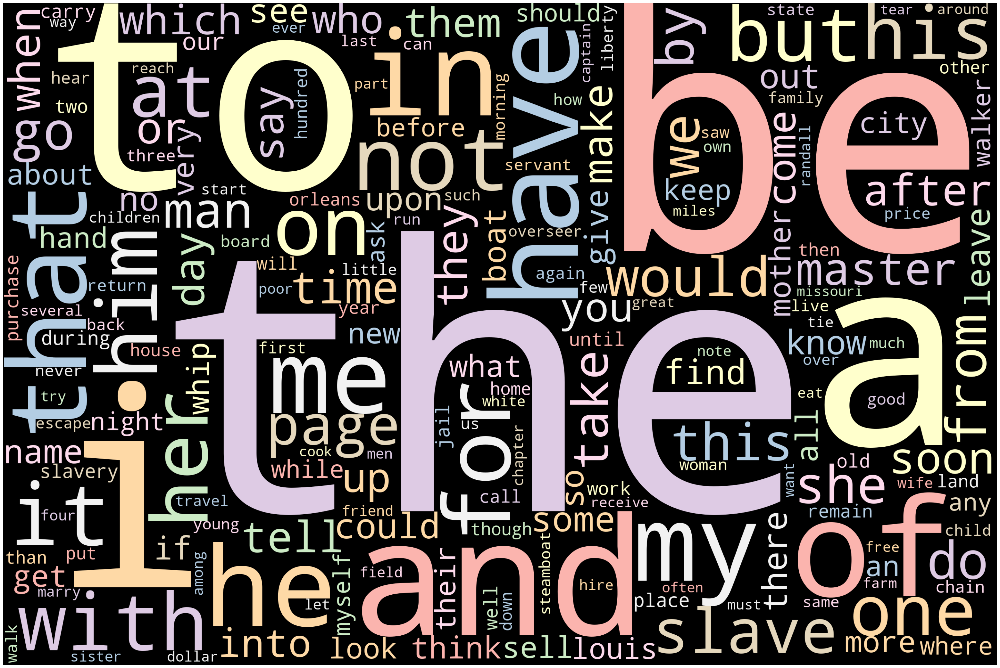

In [179]:
# Generate word cloud
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='black', colormap='Pastel1',stopwords= [], collocations=False).generate(' '.join(word_tokens_2))
# Plot
plot_cloud(wordcloud)

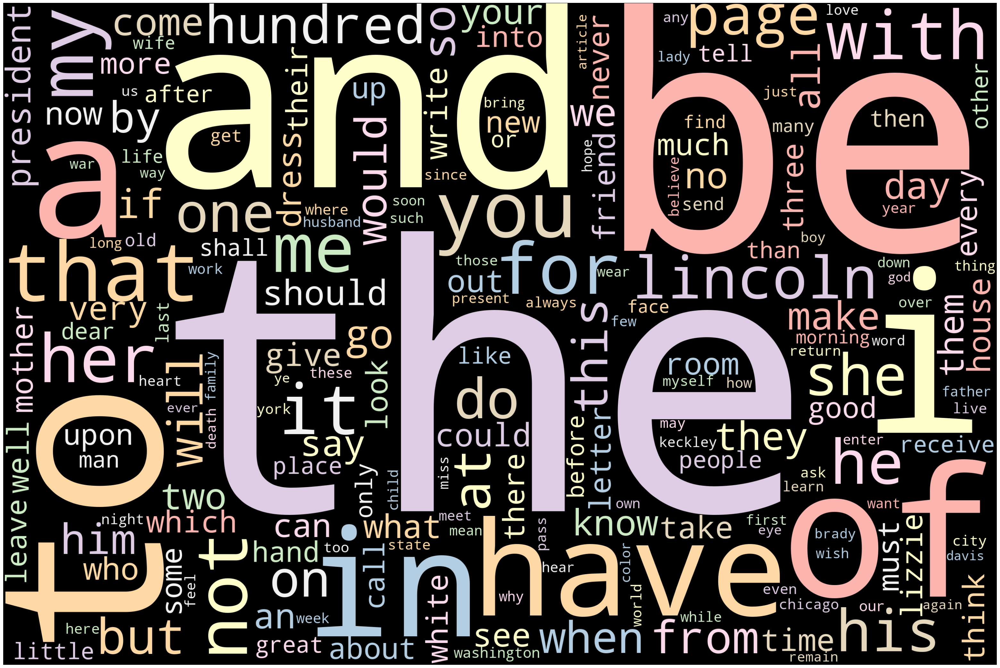

In [180]:
# Generate word cloud
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='black', colormap='Pastel1',stopwords= [], collocations=False).generate(' '.join(word_tokens_3))
# Plot
plot_cloud(wordcloud)

<AxesSubplot:>

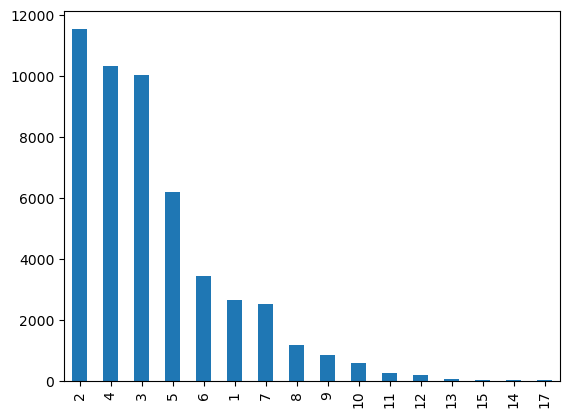

In [181]:
length = [len(word) for word in word_tokens_1]
pd.Series(length).value_counts()[:20].plot(kind='bar')

<AxesSubplot:>

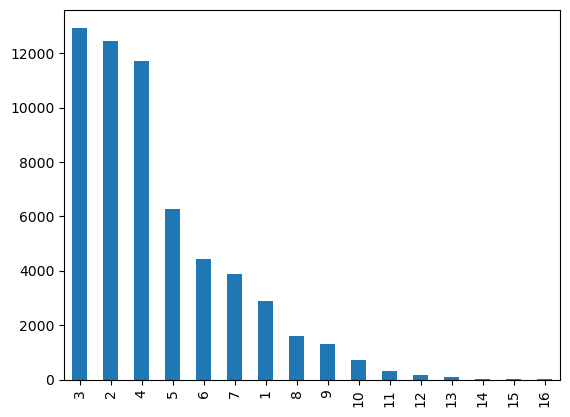

In [182]:
length = [len(word) for word in word_tokens_3]
pd.Series(length).value_counts()[:20].plot(kind='bar')

In [183]:
def remove_stopwords(tokens):
    return [word for word in tokens if word not in STOPWORDS]


In [184]:
word_tokens_1 = remove_stopwords(word_tokens_1)

In [185]:
word_tokens_2 = remove_stopwords(word_tokens_2)

In [186]:
word_tokens_3 = remove_stopwords(word_tokens_3)

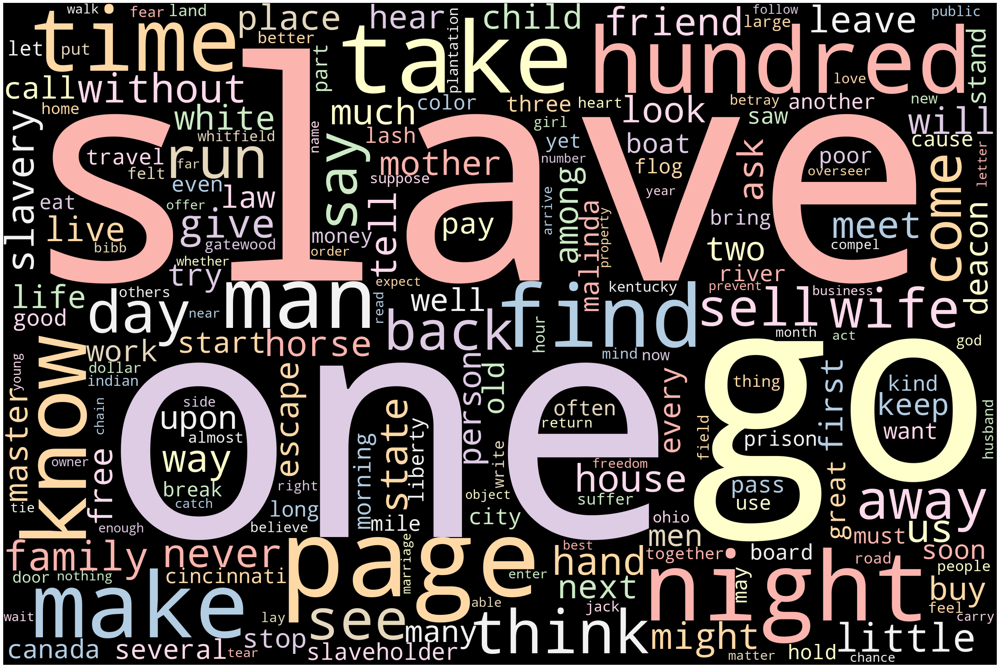

In [187]:
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='black', colormap='Pastel1',stopwords= [], collocations=False).generate(' '.join(word_tokens_1))

plot_cloud(wordcloud)

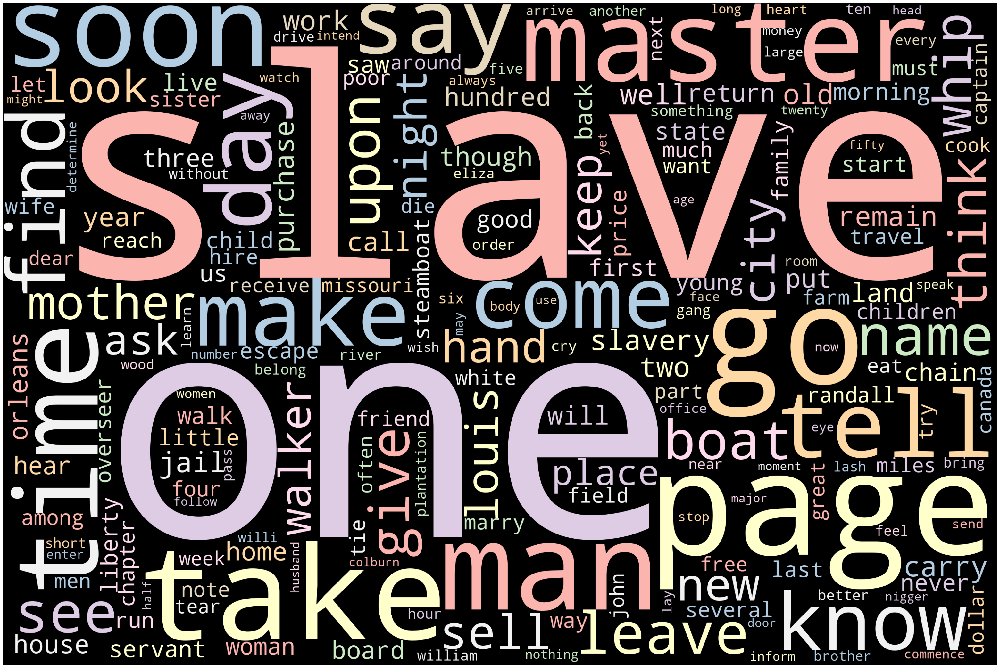

In [188]:
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='black', colormap='Pastel1',stopwords= [], collocations=False).generate(' '.join(word_tokens_2))

plot_cloud(wordcloud)

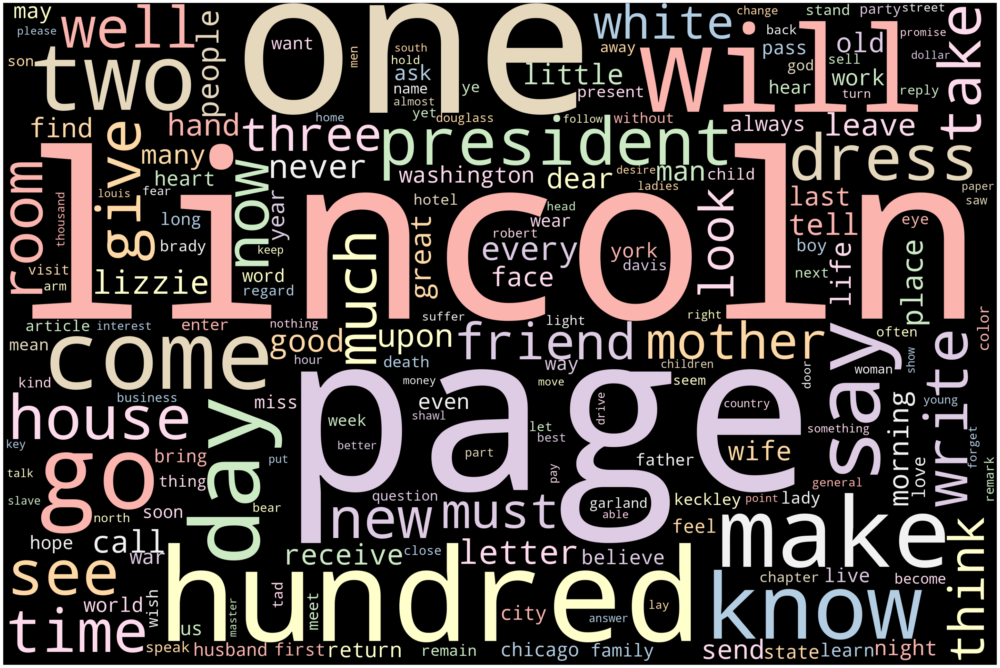

In [189]:
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='black', colormap='Pastel1',stopwords= [], collocations=False).generate(' '.join(word_tokens_3))

plot_cloud(wordcloud)

<AxesSubplot:>

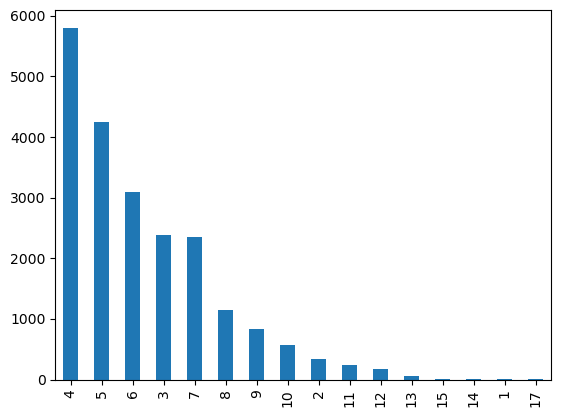

In [192]:
length = [len(word) for word in word_tokens_1]
pd.Series(length).value_counts()[:20].plot(kind='bar')

<AxesSubplot:>

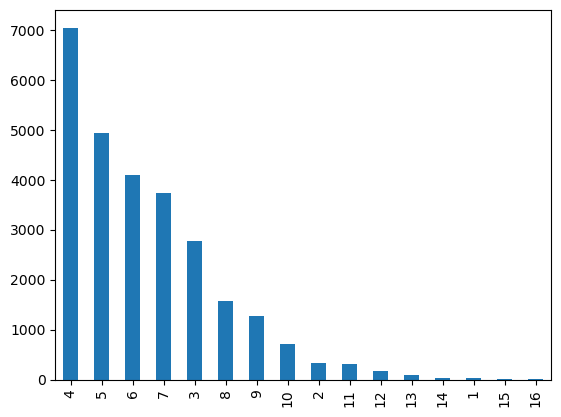

In [193]:
length = [len(word) for word in word_tokens_3]
pd.Series(length).value_counts()[:20].plot(kind='bar')

<AxesSubplot:>

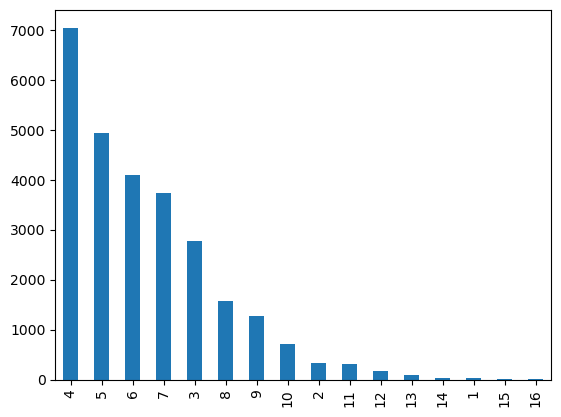

In [194]:
length = [len(word) for word in word_tokens_3]
pd.Series(length).value_counts()[:20].plot(kind='bar')

In [195]:
from collections import Counter

In [196]:
def tag_treebank(text):
  tokenized=nltk.word_tokenize(text)
  tagged=nltk.pos_tag(tokenized)
  return tagged

In [197]:
from collections import Counter
def get_counts(tags):
  counts = Counter( tag for word,  tag in tags)
  return counts

In [198]:
book_tags_1=tag_treebank(book_text_1)
book_pos_count_1=get_counts(book_tags_1)

In [199]:
book_tags_2=tag_treebank(book_text_2)
book_pos_count_2=get_counts(book_tags_2)

In [200]:
book_tags_3=tag_treebank(book_text_3)
book_pos_count_3=get_counts(book_tags_3)

In [201]:
len(book_pos_count_1)

32

In [202]:
len(book_pos_count_2)

32

In [203]:
len(book_pos_count_3)

34

In [205]:
book_pos_count_1

Counter({'NN': 10117,
         'IN': 7041,
         'PRP$': 1470,
         'JJ': 3439,
         'RB': 2288,
         'VB': 5280,
         'MD': 869,
         'DT': 4854,
         'CC': 2386,
         'VBN': 845,
         'PRP': 3011,
         'VBD': 218,
         'VBG': 51,
         'RP': 350,
         'NNS': 1260,
         'RBR': 41,
         'VBP': 2210,
         'WRB': 303,
         'WDT': 331,
         'TO': 1905,
         'JJS': 96,
         'CD': 595,
         'WP': 285,
         'PDT': 75,
         'VBZ': 159,
         'WP$': 21,
         'JJR': 103,
         'EX': 70,
         'FW': 7,
         'RBS': 57,
         'UH': 3,
         'NNP': 4})

In [206]:
book_pos_count_2

Counter({'NN': 3958,
         'VB': 2087,
         'VBN': 330,
         'IN': 2564,
         'DT': 1875,
         'WP': 111,
         'VBZ': 83,
         'PRP': 1291,
         'RB': 960,
         'JJ': 1214,
         'PDT': 27,
         'NNS': 457,
         'WDT': 81,
         'TO': 680,
         'PRP$': 586,
         'CD': 232,
         'CC': 855,
         'VBP': 945,
         'WRB': 130,
         'WP$': 6,
         'RP': 97,
         'JJR': 46,
         'RBR': 26,
         'MD': 275,
         'VBD': 88,
         'RBS': 8,
         'JJS': 20,
         'EX': 24,
         'FW': 1,
         'VBG': 8,
         'NNP': 1,
         '$': 1})

In [207]:
book_pos_count_3

Counter({'NN': 12327,
         'WRB': 389,
         'VB': 6234,
         'JJ': 4677,
         'CC': 2520,
         'PRP$': 1846,
         'VBP': 2813,
         'IN': 7287,
         'DT': 5714,
         'TO': 1918,
         'VBD': 274,
         'CD': 978,
         'NNP': 9,
         'NNS': 1426,
         'VBZ': 264,
         'VBN': 990,
         'RB': 3227,
         'WP': 267,
         'PRP': 3477,
         'WDT': 229,
         'RP': 221,
         'MD': 1161,
         'JJS': 108,
         'EX': 39,
         'JJR': 154,
         'VBG': 32,
         'RBR': 55,
         'RBS': 27,
         'PDT': 66,
         'UH': 12,
         'WP$': 7,
         'FW': 10,
         'NNPS': 2,
         'SYM': 1})

In [208]:
def Tags_plotter(tags):
    myList = tags.items()
    myList = sorted(myList) 
    x, y = zip(*myList) 
    f = plb.figure()
    f.set_figwidth(20)
    plb.plot(x, y)
    plb.show()

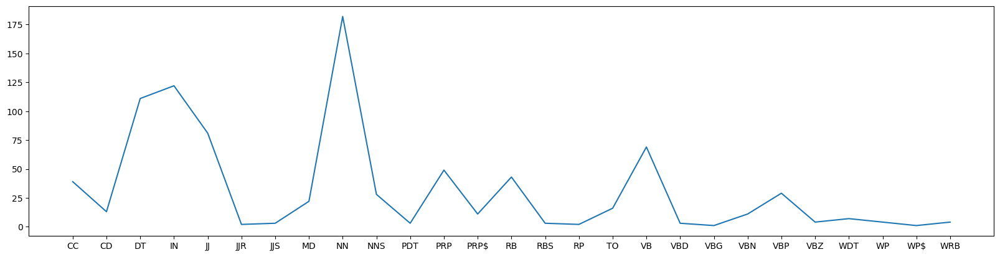

In [64]:
Tags_plotter(book_pos_count_1)

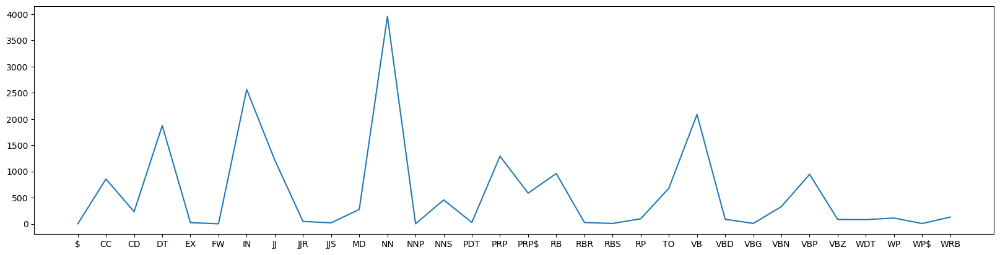

In [209]:
Tags_plotter(book_pos_count_2)

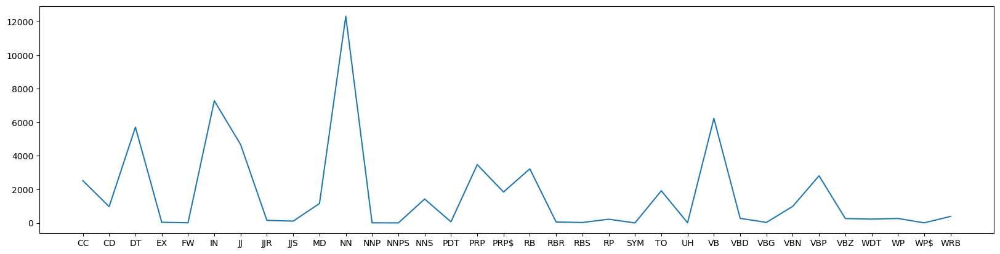

In [210]:
Tags_plotter(book_pos_count_3)

In [211]:
def noun(text):
  is_noun = lambda pos: pos[:1] == 'N'
  tokenized = nltk.word_tokenize(text)
  nouns = [word for (word, pos) in nltk.pos_tag(tokenized) if is_noun(pos)] 
  return nouns

In [214]:
noun_text_1 = noun(book_text_1)

In [215]:
noun_text_2 = noun(book_text_2)

In [216]:
noun_text_3 = noun(book_text_3)

In [217]:
print("Number of nouns in the 1st Narrative is "+ str(len(noun_text_1)))

Number of nouns in the 1st Narrative is 11381


In [218]:
print("Number of nouns in the 2nd Narrative is "+ str(len(noun_text_2)))

Number of nouns in the 2nd Narrative is 4416


In [219]:
print("Number of nouns in the 3rd Narrative is "+ str(len(noun_text_3)))

Number of nouns in the 3rd Narrative is 13764


In [220]:
def verb(text):
  is_verb = lambda pos: pos[:1] == 'V'
  tokenized = nltk.word_tokenize(text)
  verbs = [word for (word, pos) in nltk.pos_tag(tokenized) if is_verb(pos)] 
  return verbs

In [221]:
verb_text_1 = verb(book_text_1)

In [222]:
verb_text_2 = verb(book_text_2)

In [223]:
verb_text_3 = verb(book_text_3)

In [224]:
print("Number of verbs in the 1st Narrative is "+ str(len(verb_text_1)))

Number of verbs in the 1st Narrative is 8763


In [225]:
print("Number of verbs in the 2nd Narrative is "+ str(len(verb_text_2)))

Number of verbs in the 2nd Narrative is 3541


In [226]:
print("Number of verbs in the 3rd Narrative is "+ str(len(verb_text_3)))

Number of verbs in the 3rd Narrative is 10607


In [227]:
from nltk.corpus import wordnet as wn

In [228]:
#gives the categories of nouns or verb that the word belongs to
from nltk.corpus import wordnet as wn
def synset(words):
  categories=[]
  for word in words:
    cat=[]
    for synset in wn.synsets(word):
      if(('noun' in synset.lexname()) & ('Tops' not in synset.lexname()) ):
        cat.append(synset.lexname())
      if('verb' in synset.lexname()):
        cat.append(synset.lexname())
    categories.append(cat)
  return categories

In [230]:
noun_syn_1=synset(noun_text_1)
verb_syn_1=synset(verb_text_1)
noun_syn_2=synset(noun_text_2)
verb_syn_2=synset(verb_text_2)
noun_syn_3=synset(noun_text_3)
verb_syn_3=synset(verb_text_3)

In [232]:
print(noun_text_1[820])

canada


In [234]:
print(noun_text_2[82])

field


In [235]:
print(noun_text_3[80])

evil


In [237]:
print(noun_syn_1[850][:])

['noun.location', 'noun.group', 'noun.group', 'noun.state', 'noun.state', 'noun.location', 'noun.group', 'verb.communication', 'verb.communication', 'verb.communication']


In [238]:
print(noun_syn_2[850][:])

['noun.substance', 'noun.quantity', 'noun.communication']


In [239]:
print(noun_syn_3[850][:])

['noun.person', 'noun.person', 'noun.person', 'noun.artifact']


In [240]:
print(verb_syn_1[850][:])

['noun.person', 'verb.possession', 'verb.stative', 'verb.perception', 'verb.possession', 'verb.change', 'verb.consumption', 'verb.social', 'verb.creation', 'verb.possession', 'verb.stative', 'verb.change', 'verb.body', 'verb.communication', 'verb.possession', 'verb.possession', 'verb.body', 'verb.possession', 'verb.body', 'verb.contact']


In [241]:
print(verb_syn_2[850][:])

['noun.substance', 'verb.stative', 'verb.stative', 'verb.stative', 'verb.stative', 'verb.stative', 'verb.stative', 'verb.stative', 'verb.social', 'verb.stative', 'verb.possession', 'verb.stative', 'verb.stative', 'verb.stative']


In [242]:
print(verb_syn_3[850][:])

['noun.body', 'verb.motion', 'verb.motion', 'verb.change', 'verb.change', 'verb.stative', 'verb.change', 'verb.stative', 'verb.stative', 'verb.stative', 'verb.stative', 'verb.motion', 'verb.stative', 'verb.change', 'verb.stative', 'verb.stative', 'verb.motion', 'verb.cognition', 'verb.stative', 'verb.stative', 'verb.perception', 'verb.cognition']


In [243]:
#GIVES TOTAL NOUN LEXNAMES AND TOTAL VERB LEXNAMES FOR FREQUENCY DISTRIBUTIONS
def all_synsets(no,ve):
  nouns=[]
  verbs=[]
  for word in no:
    for synset in wn.synsets(word): 
      if(('noun' in synset.lexname()) & ('Tops' not in synset.lexname()) ):
        nouns.append(synset.lexname())
      if('verb' in synset.lexname()):
        verbs.append(synset.lexname())
  for word in ve:
    for synset in wn.synsets(word): 
      if(('noun' in synset.lexname()) & ('Tops' not in synset.lexname()) ):
        nouns.append(synset.lexname())
      if('verb' in synset.lexname()):
        verbs.append(synset.lexname())
      
  return nouns,verbs

In [244]:
noun_superset_1,verb_superset_1=all_synsets(noun_text_1,verb_text_1)

In [247]:
noun_superset_2,verb_superset_2=all_synsets(noun_text_2,verb_text_2)

In [248]:
noun_superset_3,verb_superset_3=all_synsets(noun_text_3,verb_text_3)

In [245]:
noun_superset_1

['noun.communication',
 'noun.time',
 'noun.group',
 'noun.group',
 'noun.event',
 'noun.artifact',
 'noun.communication',
 'noun.communication',
 'noun.communication',
 'noun.state',
 'noun.event',
 'noun.attribute',
 'noun.act',
 'noun.act',
 'noun.location',
 'noun.event',
 'noun.act',
 'noun.act',
 'noun.person',
 'noun.substance',
 'noun.person',
 'noun.person',
 'noun.cognition',
 'noun.act',
 'noun.cognition',
 'noun.act',
 'noun.act',
 'noun.act',
 'noun.event',
 'noun.group',
 'noun.act',
 'noun.act',
 'noun.act',
 'noun.time',
 'noun.state',
 'noun.quantity',
 'noun.object',
 'noun.event',
 'noun.event',
 'noun.event',
 'noun.attribute',
 'noun.act',
 'noun.attribute',
 'noun.person',
 'noun.object',
 'noun.attribute',
 'noun.cognition',
 'noun.state',
 'noun.act',
 'noun.act',
 'noun.substance',
 'noun.quantity',
 'noun.communication',
 'noun.person',
 'noun.person',
 'noun.person',
 'noun.person',
 'noun.substance',
 'noun.person',
 'noun.person',
 'noun.cognition',
 'noun.

In [249]:
noun_superset_2

['noun.communication',
 'noun.time',
 'noun.group',
 'noun.group',
 'noun.event',
 'noun.substance',
 'noun.quantity',
 'noun.communication',
 'noun.location',
 'noun.location',
 'noun.act',
 'noun.person',
 'noun.person',
 'noun.person',
 'noun.animal',
 'noun.person',
 'noun.person',
 'noun.person',
 'noun.person',
 'noun.location',
 'noun.artifact',
 'noun.animal',
 'noun.communication',
 'noun.artifact',
 'noun.quantity',
 'noun.act',
 'noun.communication',
 'noun.act',
 'noun.possession',
 'noun.communication',
 'noun.time',
 'noun.event',
 'noun.process',
 'noun.relation',
 'noun.person',
 'noun.person',
 'noun.possession',
 'noun.attribute',
 'noun.location',
 'noun.cognition',
 'noun.artifact',
 'noun.communication',
 'noun.artifact',
 'noun.communication',
 'noun.communication',
 'noun.possession',
 'noun.group',
 'noun.group',
 'noun.communication',
 'noun.communication',
 'noun.communication',
 'noun.artifact',
 'noun.person',
 'noun.substance',
 'noun.person',
 'noun.person

In [250]:
noun_superset_3

['noun.communication',
 'noun.time',
 'noun.group',
 'noun.group',
 'noun.event',
 'noun.substance',
 'noun.quantity',
 'noun.communication',
 'noun.communication',
 'noun.time',
 'noun.group',
 'noun.group',
 'noun.event',
 'noun.quantity',
 'noun.time',
 'noun.feeling',
 'noun.feeling',
 'noun.cognition',
 'noun.state',
 'noun.communication',
 'noun.time',
 'noun.group',
 'noun.group',
 'noun.event',
 'noun.state',
 'noun.state',
 'noun.communication',
 'noun.time',
 'noun.group',
 'noun.group',
 'noun.event',
 'noun.quantity',
 'noun.act',
 'noun.group',
 'noun.group',
 'noun.group',
 'noun.group',
 'noun.person',
 'noun.group',
 'noun.group',
 'noun.group',
 'noun.person',
 'noun.person',
 'noun.person',
 'noun.person',
 'noun.person',
 'noun.person',
 'noun.person',
 'noun.person',
 'noun.communication',
 'noun.time',
 'noun.group',
 'noun.group',
 'noun.event',
 'noun.act',
 'noun.communication',
 'noun.communication',
 'noun.communication',
 'noun.communication',
 'noun.act',
 '

In [246]:
len(noun_superset_1)

75530

In [251]:
len(noun_superset_2)

29340

In [252]:
len(noun_superset_3)

87564

In [253]:
len(verb_superset_1)

145969

In [254]:
len(verb_superset_2)

60578

In [255]:
len(verb_superset_3)

161296

<BarContainer object of 25 artists>

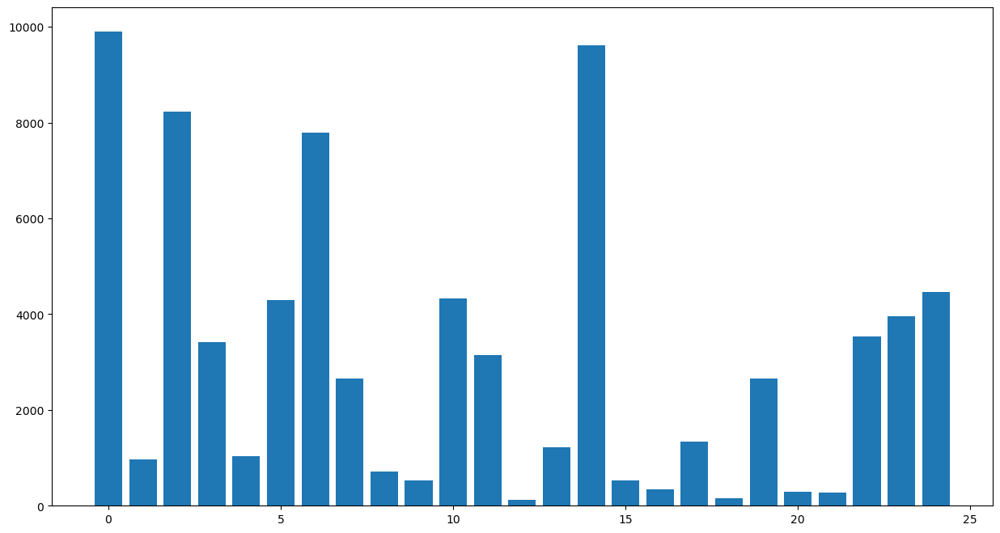

In [264]:
import numpy as np
labels_1, counts_1 = np.unique(noun_superset_1,return_counts=True)
import matplotlib.pyplot as plt 
ticks_1 = range(len(counts_1))
plt.figure(figsize=(15,8))
plt.bar(ticks_1,counts_1, align='center')

In [258]:
print(labels_1)

['noun.act' 'noun.animal' 'noun.artifact' 'noun.attribute' 'noun.body'
 'noun.cognition' 'noun.communication' 'noun.event' 'noun.feeling'
 'noun.food' 'noun.group' 'noun.location' 'noun.motive' 'noun.object'
 'noun.person' 'noun.phenomenon' 'noun.plant' 'noun.possession'
 'noun.process' 'noun.quantity' 'noun.relation' 'noun.shape' 'noun.state'
 'noun.substance' 'noun.time']


([<matplotlib.axis.XTick at 0x18a87928ca0>,
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9'),
  Text(10, 0, '10'),
  Text(11, 0, '11'),
  Text(12, 0, '12'),
  Text(13, 0, '13')])

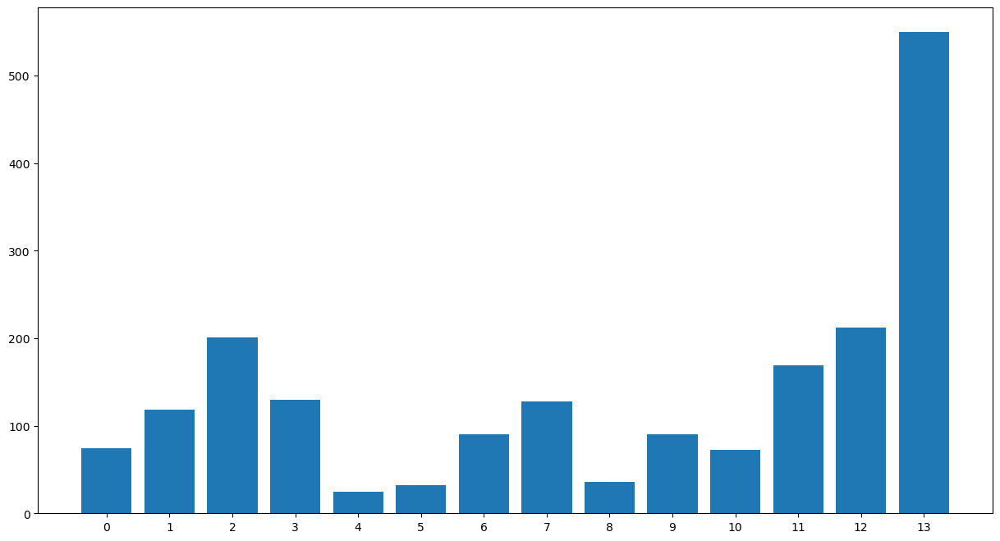

In [274]:
labels, counts = np.unique(verb_superset,return_counts=True)
ticks = range(len(counts))
plt.figure(figsize=(15,8))
plt.bar(ticks,counts, align='center')
plt.xticks(ticks, range(len(labels)))

In [275]:
import spacy
from spacy import displacy  
from collections import Counter
import en_core_web_sm
nlp = en_core_web_sm.load()
nlp.max_length = len(book_text_1)
doc = nlp(book_text_1)

print("there are total "+str(len(doc.ents))+" entities in book")

there are total 1131 entities in book


In [276]:
book_text_1

'chapter sketch of my early separation from my mother hard first experiment at run earnest long for abhorrent nature of slavery i be bear may of a slave mother in shelby county kentucky and be claim as the property of david white esq he come into possession of my mother long before i be bear i be bring up in the counties of shelby henry oldham and trimble or more correctly speak in the above counties i may safely say i be flog up for where i should have receive moral mental and religious instruction i receive strip without number the object of which be to degrade and keep me in subordination i can truly say that i drink deeply of the bitter cup of suffer and woe i have be drag page fourteen down to the lowest depths of human degradation and wretchedness by slaveholders my mother be know by the name of milldred jackson she be the mother of seven slave only all be sons of whom i be the eldest she be also so fortunate or unfortunate as to have some of what be call the slaveholding blood f

In [277]:

print([(X, X.ent_iob_) for X in doc[:100000]])

[(chapter, 'O'), (sketch, 'O'), (of, 'O'), (my, 'O'), (early, 'O'), (separation, 'O'), (from, 'O'), (my, 'O'), (mother, 'O'), (hard, 'O'), (first, 'B'), (experiment, 'O'), (at, 'O'), (run, 'O'), (earnest, 'O'), (long, 'O'), (for, 'O'), (abhorrent, 'O'), (nature, 'O'), (of, 'O'), (slavery, 'O'), (i, 'O'), (be, 'O'), (bear, 'O'), (may, 'O'), (of, 'O'), (a, 'O'), (slave, 'O'), (mother, 'O'), (in, 'O'), (shelby, 'B'), (county, 'I'), (kentucky, 'I'), (and, 'O'), (be, 'O'), (claim, 'O'), (as, 'O'), (the, 'O'), (property, 'O'), (of, 'O'), (david, 'B'), (white, 'I'), (esq, 'I'), (he, 'O'), (come, 'O'), (into, 'O'), (possession, 'O'), (of, 'O'), (my, 'O'), (mother, 'O'), (long, 'O'), (before, 'O'), (i, 'O'), (be, 'O'), (bear, 'O'), (i, 'O'), (be, 'O'), (bring, 'O'), (up, 'O'), (in, 'O'), (the, 'O'), (counties, 'O'), (of, 'O'), (shelby, 'O'), (henry, 'B'), (oldham, 'I'), (and, 'O'), (trimble, 'O'), (or, 'O'), (more, 'O'), (correctly, 'O'), (speak, 'O'), (in, 'O'), (the, 'O'), (above, 'O'), (coun

In [278]:
def entity_recognition(text):
  doc=nlp(text)
  person=[]
  org=[]
  location=[]
  for X in doc:  
    if (X.ent_type_=='PERSON') and X.text not in person:
      person.append(X.text)
    if (X.ent_type_=='ORG')and X.text not in org:
      org.append(X.text)
    if ((X.ent_type_=='LOC') or (X.ent_type_=='GPE')) and X.text not in location:
      location.append(X.text)
  return person,org,location

In [279]:
len(book_text_1)

244460

In [280]:
print(org1)

['the', 'new', 'york']


In [281]:
person,org1,location=entity_recognition(book_text_1)

print("number of person entities in the book are "+str(len(person)))
print("number of organization entities in the book are "+str(len(org1)))
print("number of location entities in the book are "+str(len(location)))

number of person entities in the book are 51
number of organization entities in the book are 29
number of location entities in the book are 43


In [282]:
def freq(str_list): 
    unique_words = set(str_list)
    counts = {}
    for words in unique_words : 
        counts[words] = str_list.count(words)
    return counts

In [283]:
X = freq(person)
print(sorted(X.items(), key = lambda kv:(kv[1], kv[0]),reverse=True)) 

[('wilson', 1), ('william', 1), ('whitfield', 1), ('white', 1), ('thou', 1), ('thomas', 1), ('this', 1), ('street', 1), ('stewart', 1), ('stephen', 1), ('spring', 1), ('smith', 1), ('sibley', 1), ('samuel', 1), ('page', 1), ('ore', 1), ('one', 1), ('oldham', 1), ('mule', 1), ('mount', 1), ('miles', 1), ('mary', 1), ('madison', 1), ('lane', 1), ('joseph', 1), ('john', 1), ('jack', 1), ('indiana', 1), ('hollister', 1), ('henry', 1), ('hast', 1), ('god', 1), ('george', 1), ('gatewood', 1), ('garrison', 1), ('francis', 1), ('esq', 1), ('doyle', 1), ('deacon', 1), ('davis', 1), ('david', 1), ('daniel', 1), ('dan', 1), ('cry', 1), ('chas', 1), ('bush', 1), ('brook', 1), ('bro', 1), ('bibb', 1), ('awaken', 1), ('albert', 1)]


In [284]:
X = freq(location)
print(sorted(X.items(), key = lambda kv:(kv[1], kv[0]),reverse=True)) 

[('york', 1), ('washington', 1), ('virginia', 1), ('toledo', 1), ('thrill', 1), ('the', 1), ('texas', 1), ('tennessee', 1), ('shelby', 1), ('rock', 1), ('river', 1), ('pittsburgh', 1), ('oxen', 1), ('orleans', 1), ('oldham', 1), ('ohio', 1), ('newcastle', 1), ('new', 1), ('missouri', 1), ('mississippi', 1), ('michigan', 1), ('maryland', 1), ('madison', 1), ('louisville', 1), ('louisiana', 1), ('little', 1), ('kentucky', 1), ('jefferson', 1), ('israel', 1), ('indiana', 1), ('handcuff', 1), ('georgia', 1), ('england', 1), ('earth', 1), ('detroit', 1), ('county', 1), ('city', 1), ('cincinnati', 1), ('canada', 1), ('boston', 1), ('arkansas', 1), ('america', 1), ('africa', 1)]


In [285]:
X = freq(org1)
print(sorted(X.items(), key = lambda kv:(kv[1], kv[0]),reverse=True)) 

[('york', 1), ('wagon', 1), ('the', 1), ('rocky', 1), ('perrysburgh', 1), ('ore', 1), ('one', 1), ('ohio', 1), ('of', 1), ('new', 1), ('michigan', 1), ('methodist', 1), ('maysville', 1), ('louisville', 1), ('lane', 1), ('kentucky', 1), ('house', 1), ('hill', 1), ('gallop', 1), ('ford', 1), ('dwell', 1), ('detroit', 1), ('daniel', 1), ('correction', 1), ('coons', 1), ('church', 1), ('bush', 1), ('bro', 1), ('bedford', 1)]
